In [2]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import warnings

warnings.filterwarnings("ignore")

data = pd.read_csv("/Users/admin/Desktop/covtype.csv")
data.head(3)

feature_names = [
    'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
    'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
    'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
    'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
    'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
    'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
    'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
    'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
    'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18',
    'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22',
    'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26',
    'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
    'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
    'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38',
    'Soil_Type39', 'Soil_Type40', 'Cover_Type'
]

data.columns = feature_names

x, y = data.shape
print(f'We have {x} number of observations and {y-1} features for this dataset to predict type of forest cover.')

data.dtypes

num_fea = data.iloc[:, :10]
binary_fea = data.iloc[:, 10:-1]

num_fea.describe()


We have 581012 number of observations and 54 features for this dataset to predict type of forest cover.


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000


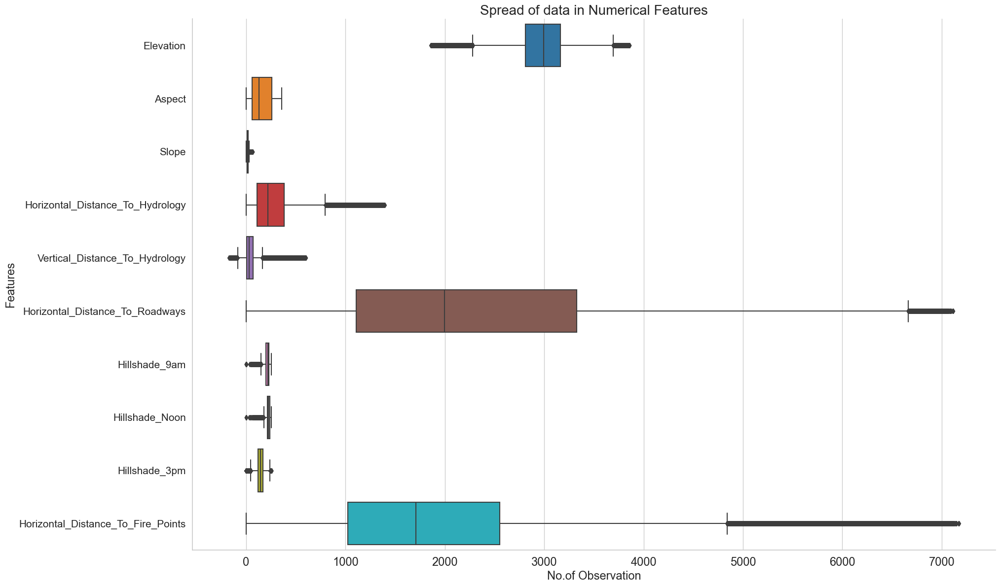

In [4]:
binary_fea.describe()
data.skew()
data.groupby('Cover_Type').size()

# Box and whiskers plot
plt.figure(figsize=(21, 14))
sns.set(style="whitegrid", palette="pastel")

sns.boxplot(data=num_fea, orient='h', palette="tab10")
plt.title('Spread of data in Numerical Features', size=20)
plt.xlabel('No.of Observation', size=17)
plt.ylabel('Features', size=17)
plt.xticks(size=17)
plt.yticks(size=15)
sns.despine()

plt.show()


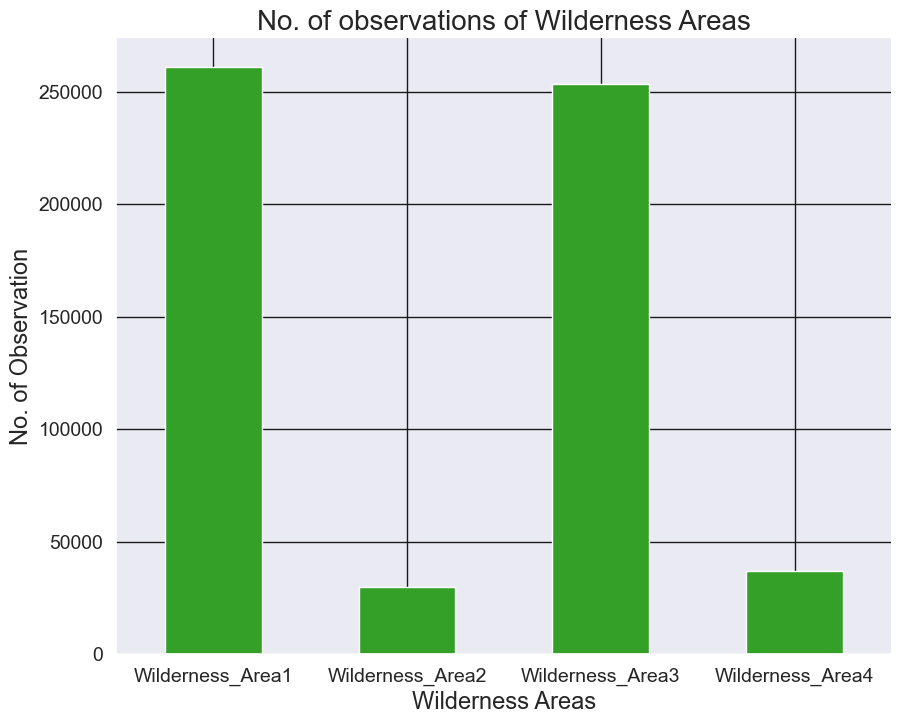

In [6]:
Wild_data, Soil_data = binary_fea.iloc[:, :4], binary_fea.iloc[:, 4:]

sns.set_style("darkgrid", {'grid.color': '.1'})
color = ["#e74c3c", "#34495e", "#2ecc71", "#3498db"]

Wild_data.sum().plot(kind='bar', figsize=(10, 8), color='#34a028')
plt.title('No. of observations of Wilderness Areas', size=20)
plt.xlabel('Wilderness Areas', size=17)
plt.ylabel('No. of Observation', size=17)
plt.xticks(rotation='horizontal', size=14)
plt.yticks(size=14)
sns.despine()

plt.show()


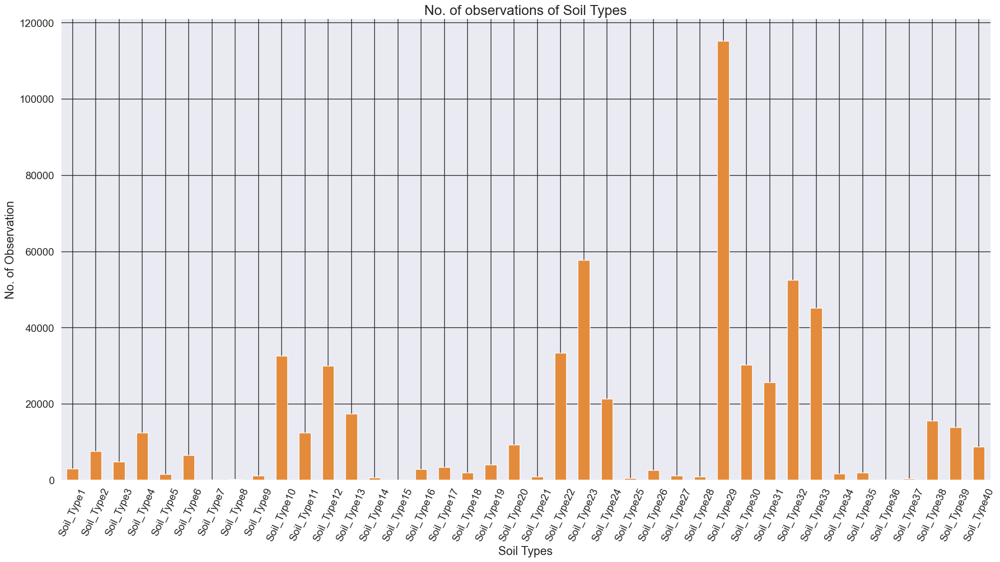

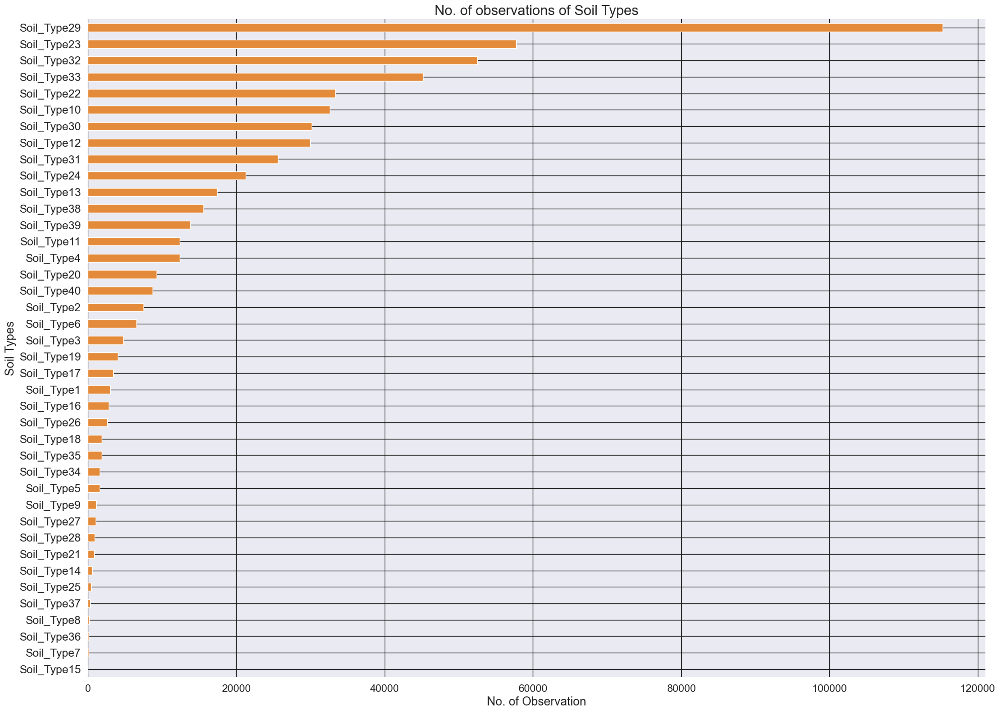

In [8]:
# 3.1 Bar plot - Soil Type Count
sns.set_style("darkgrid", {'grid.color': '.1'})
Soil_data.sum().plot(kind='bar', figsize=(24, 12), color='#e38b3a')
plt.title('No. of observations of Soil Types', size=20)
plt.xlabel('Soil Types', size=17)
plt.ylabel('No. of Observation', size=17)
plt.xticks(rotation=65, size=15)
plt.yticks(size=15)
sns.despine()
plt.show()

Soil_data.loc[:, 'Soil_Type29'].describe()

# 3.2 Horizontal Bar plot - Soil Type Count
sns.set_style("darkgrid", {'grid.color': '.1'})
soil_sum = pd.Series(Soil_data.sum())
soil_sum.sort_values(ascending=False, inplace=True)
soil_sum.plot(kind='barh', figsize=(23, 17), color='#e38b3a')
plt.gca().invert_yaxis()
plt.title('No. of observations of Soil Types', size=20)
plt.xlabel('No. of Observation', size=17)
plt.ylabel('Soil Types', size=17)
plt.xticks(rotation='horizontal', size=15)
plt.yticks(size=16)
sns.despine()
plt.show()


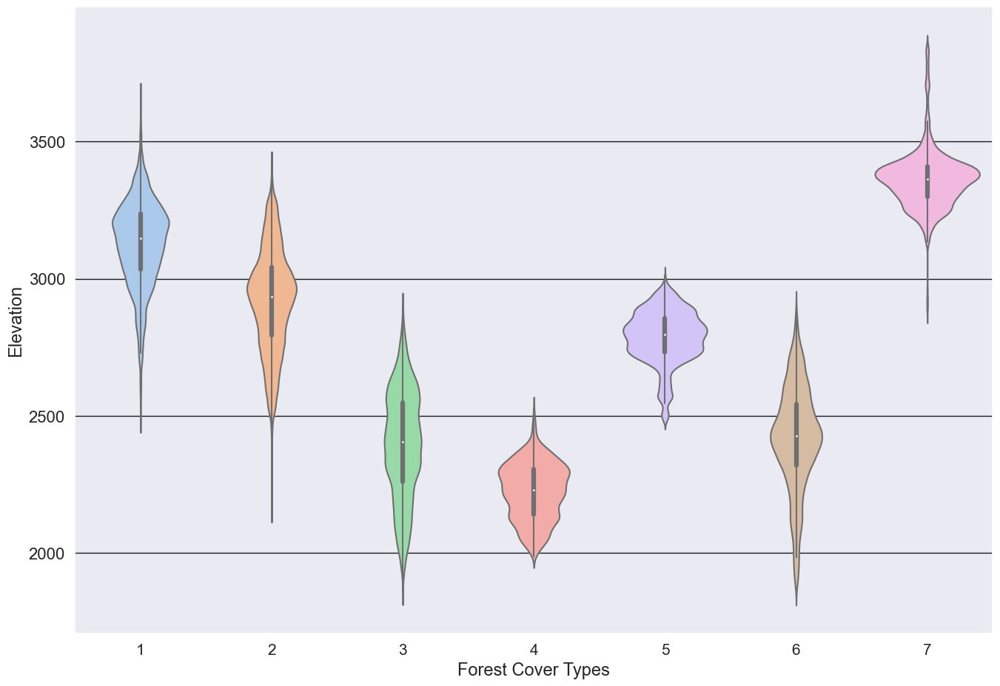

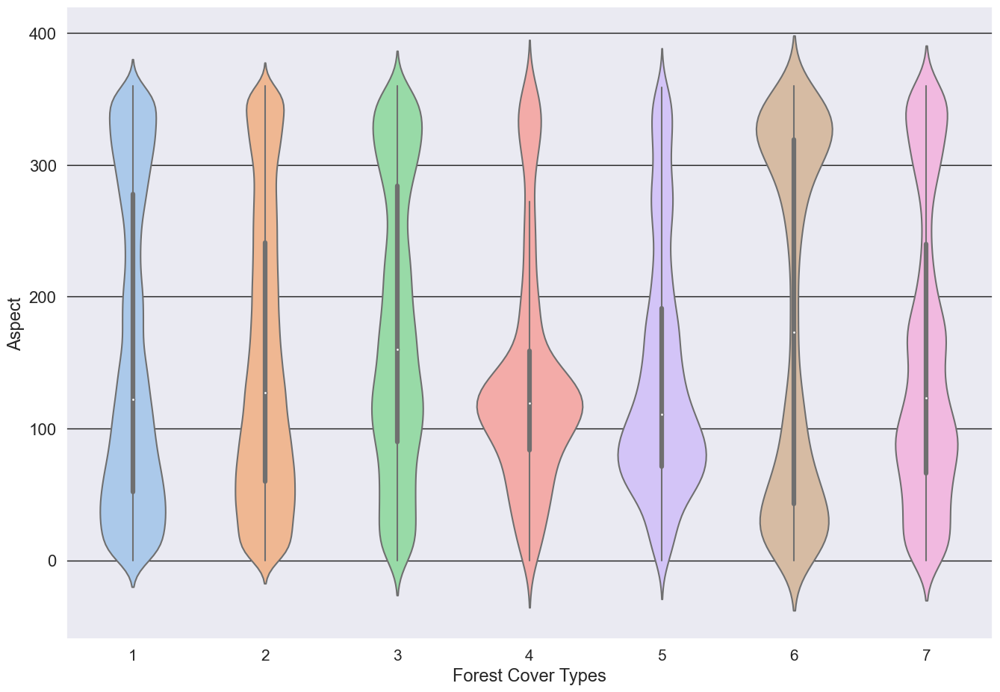

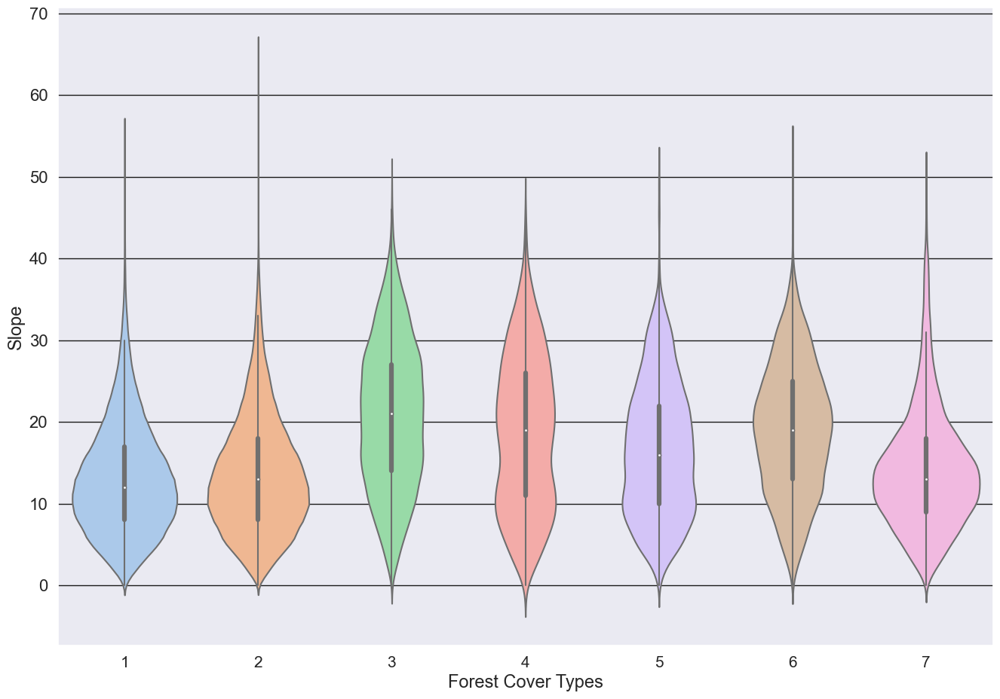

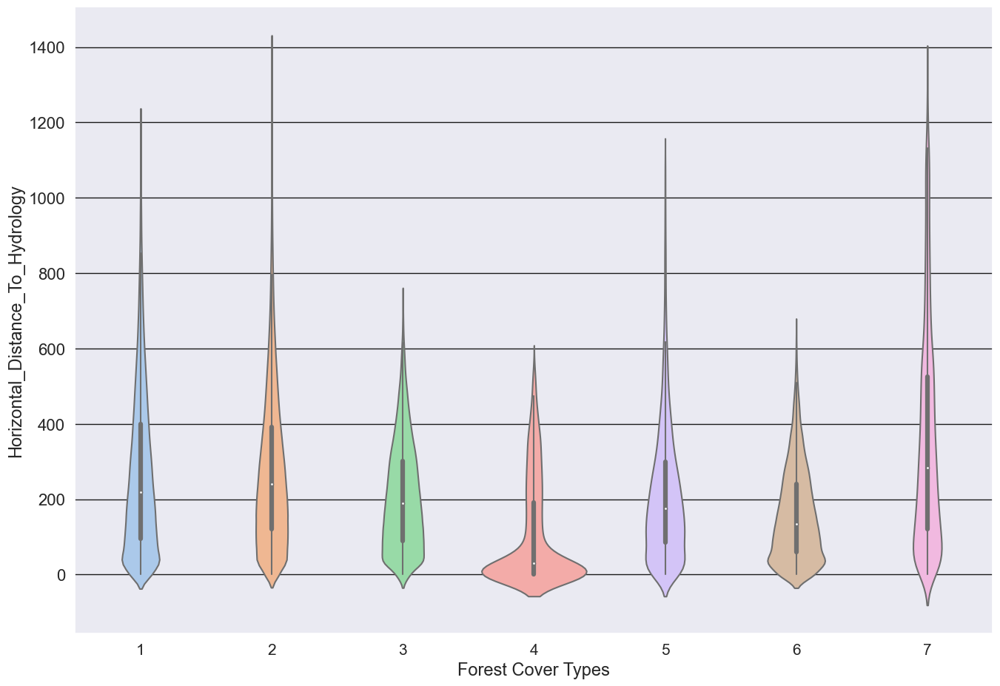

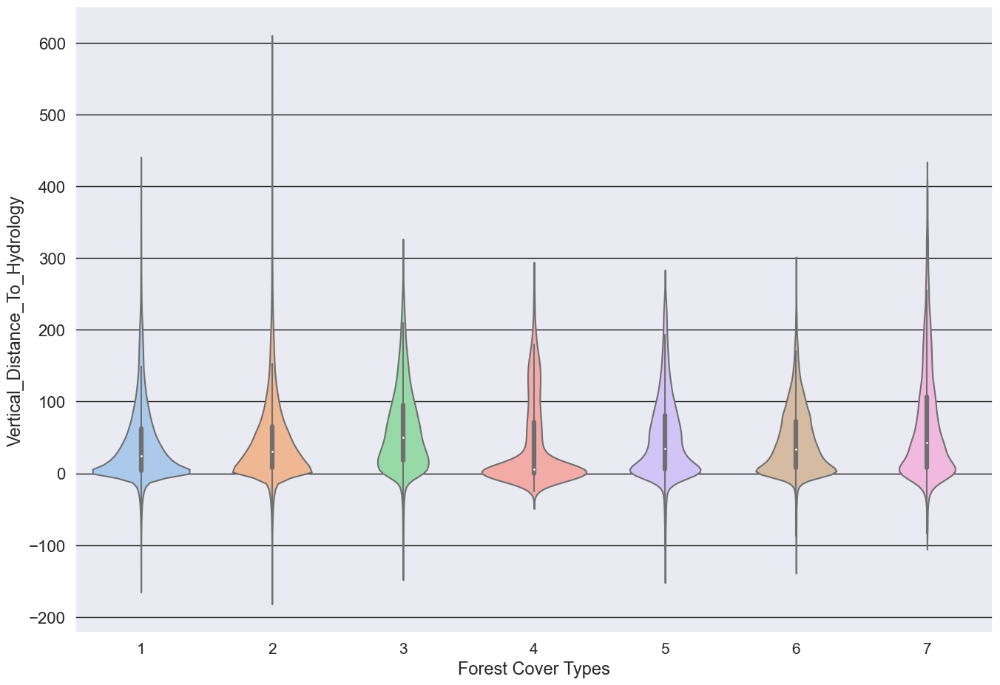

...

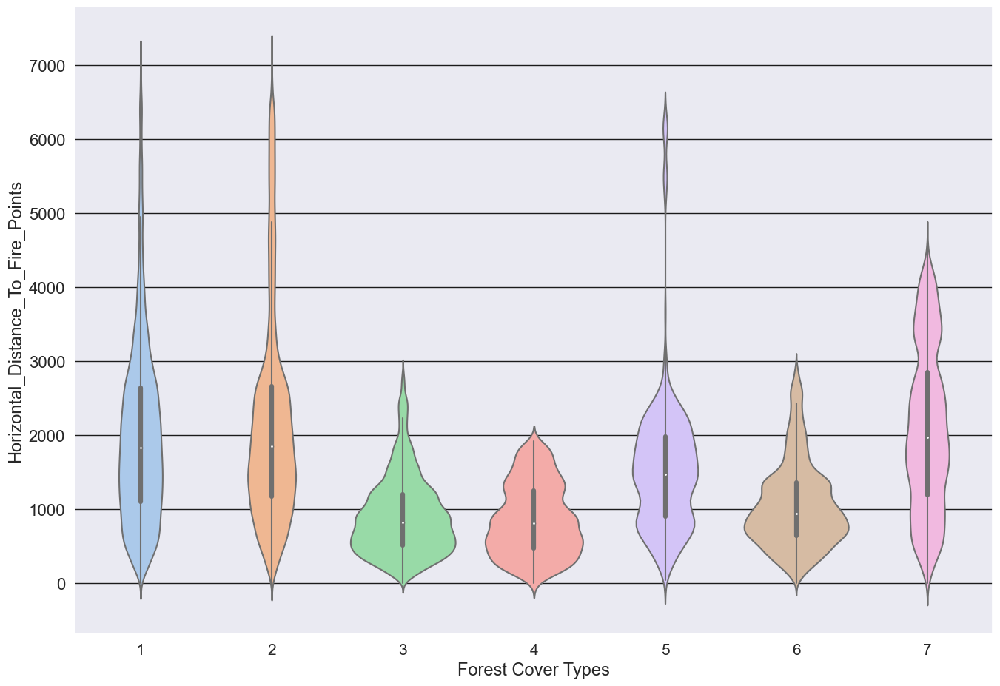

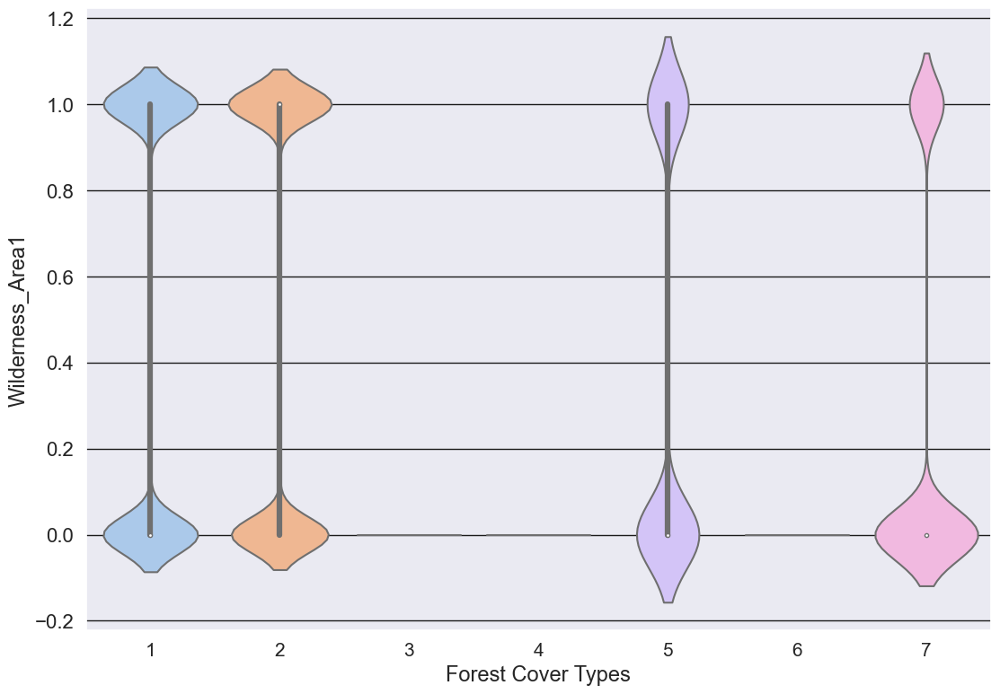

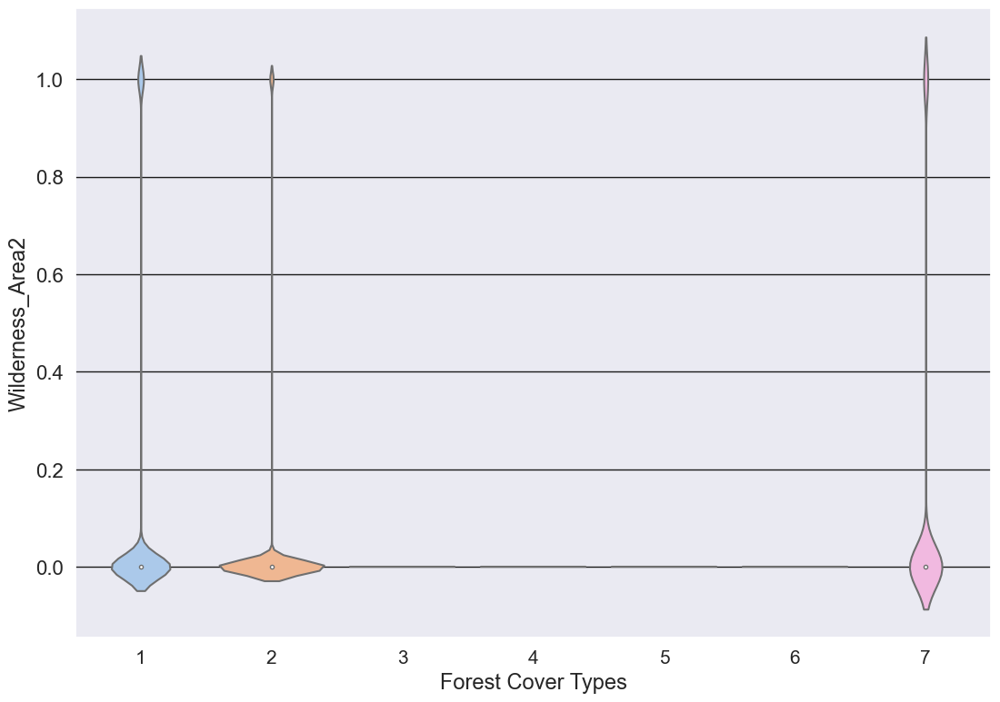

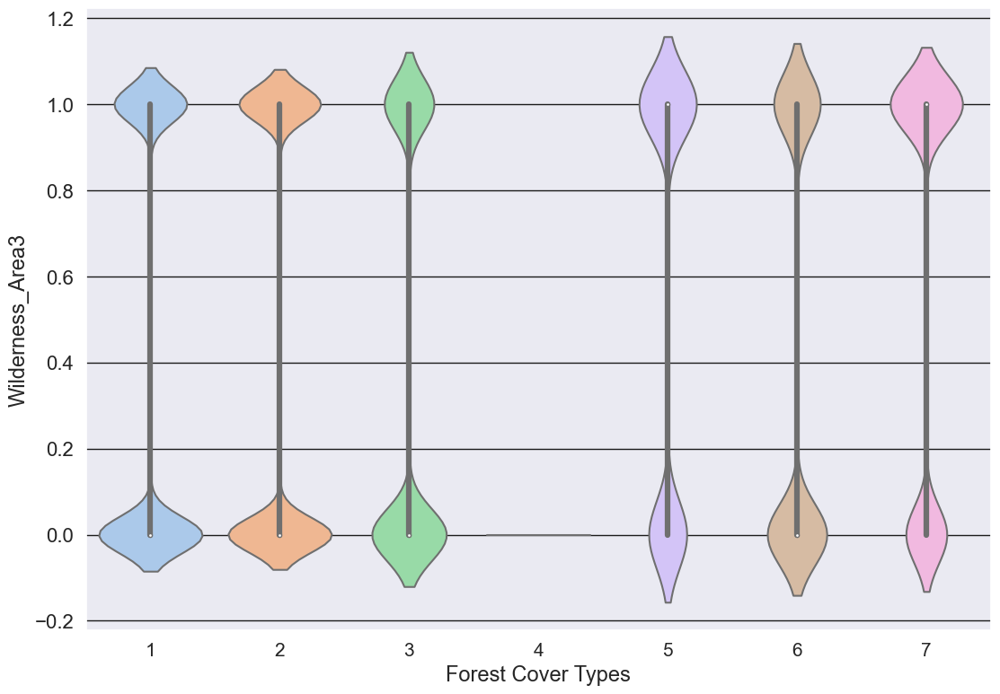

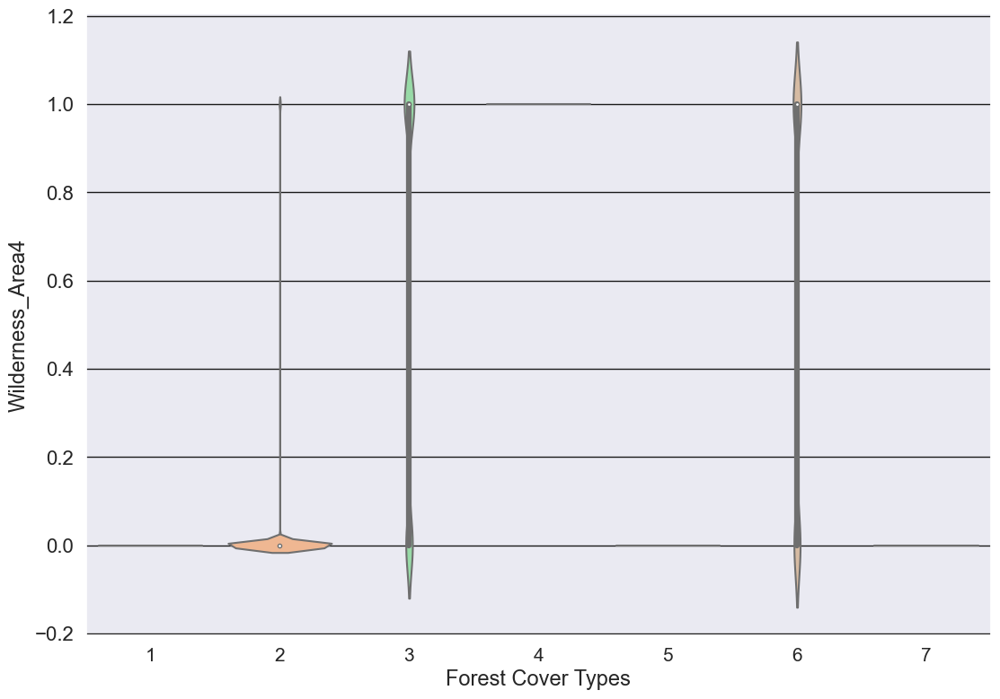

In [9]:
soil_sum

# 4.1 Violin Plot - Comparing numerical features with target variable
sns.set_style("darkgrid", {'grid.color': '.1'})
target = data['Cover_Type']
features = num_fea.columns

for i in range(len(features)):
    plt.subplots(figsize=(16, 11))
    sns.violinplot(data=num_fea, x=target, y=features[i])
    plt.xticks(size=15)
    plt.yticks(size=16)
    plt.xlabel('Forest Cover Types', size=17)
    plt.ylabel(features[i], size=17)
    plt.show()

# 4.2 Violin Plot - Comparing Wilderness features with target variable
sns.set_style("darkgrid", {'grid.color': '.1'})
target = data['Cover_Type']
features = Wild_data.columns

for i in range(len(features)):
    plt.subplots(figsize=(13, 9))
    sns.violinplot(data=Wild_data, x=target, y=features[i])
    plt.xticks(size=15)
    plt.yticks(size=16)
    plt.xlabel('Forest Cover Types', size=17)
    plt.ylabel(features[i], size=17)
    plt.show()

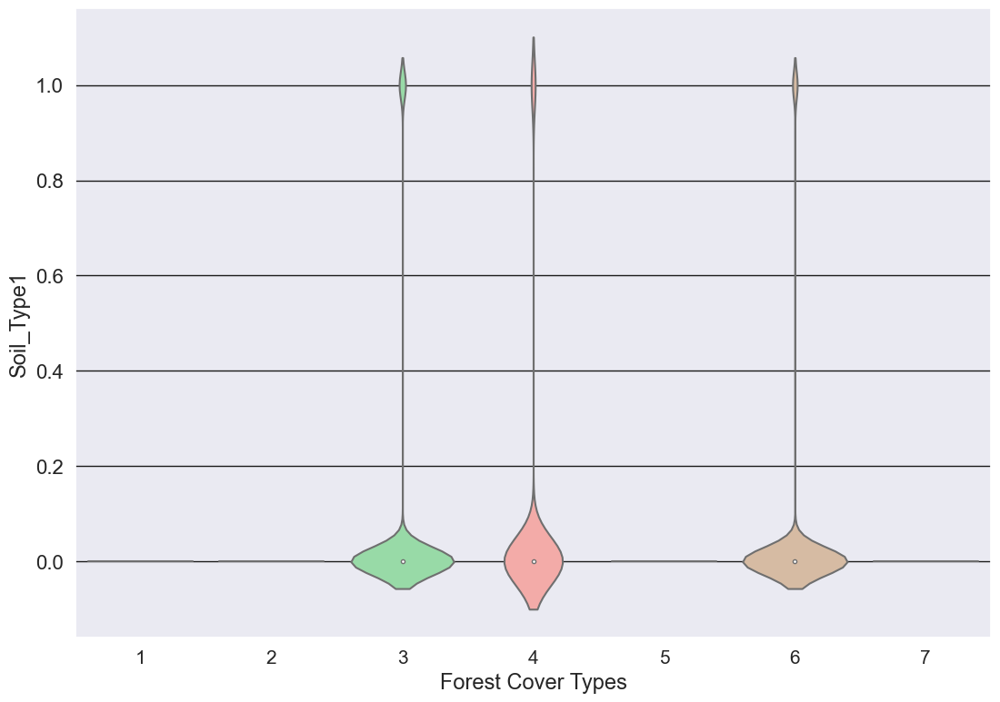

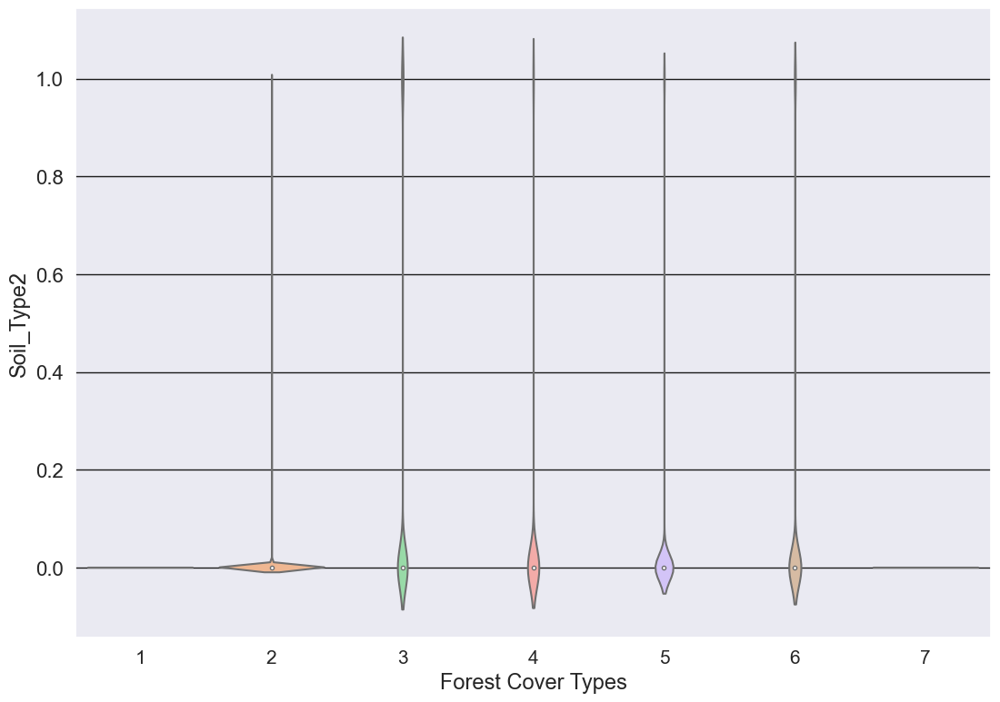

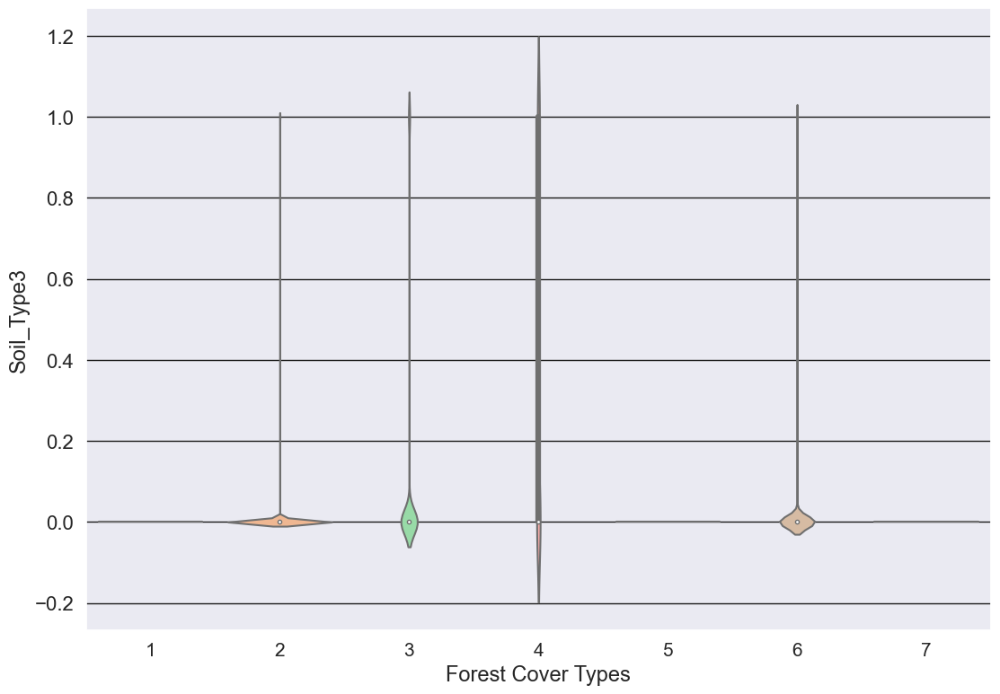

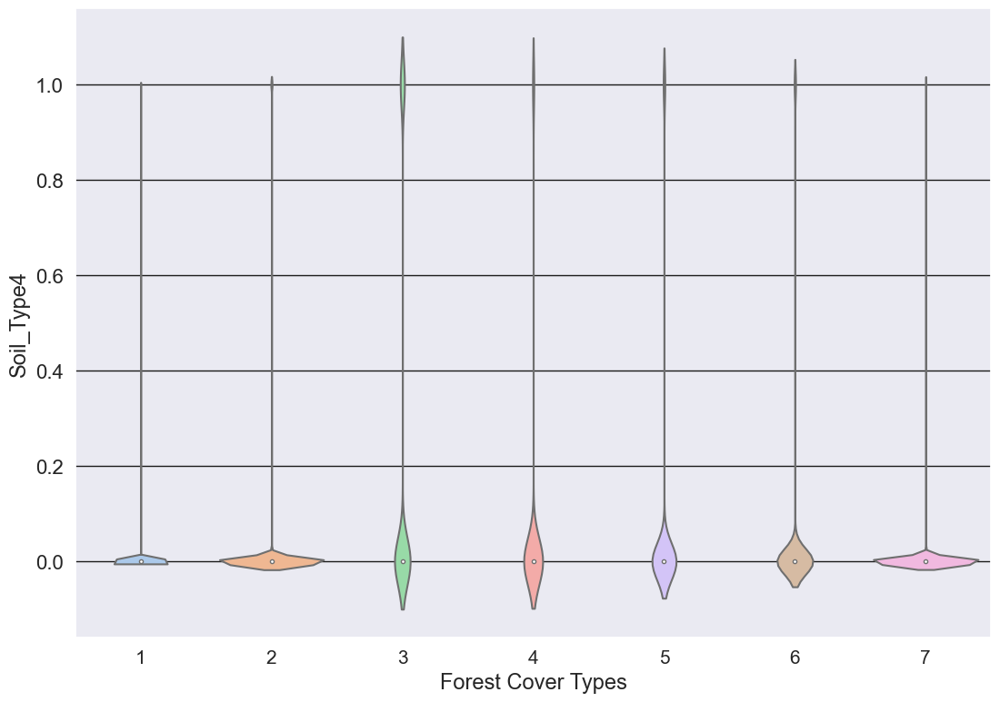

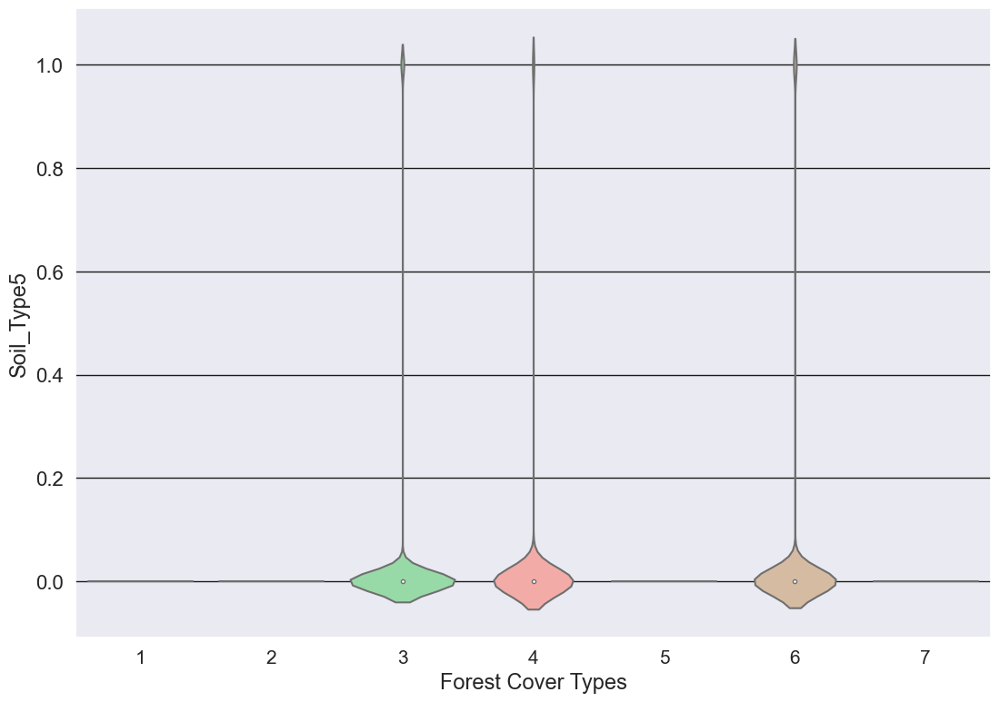

...

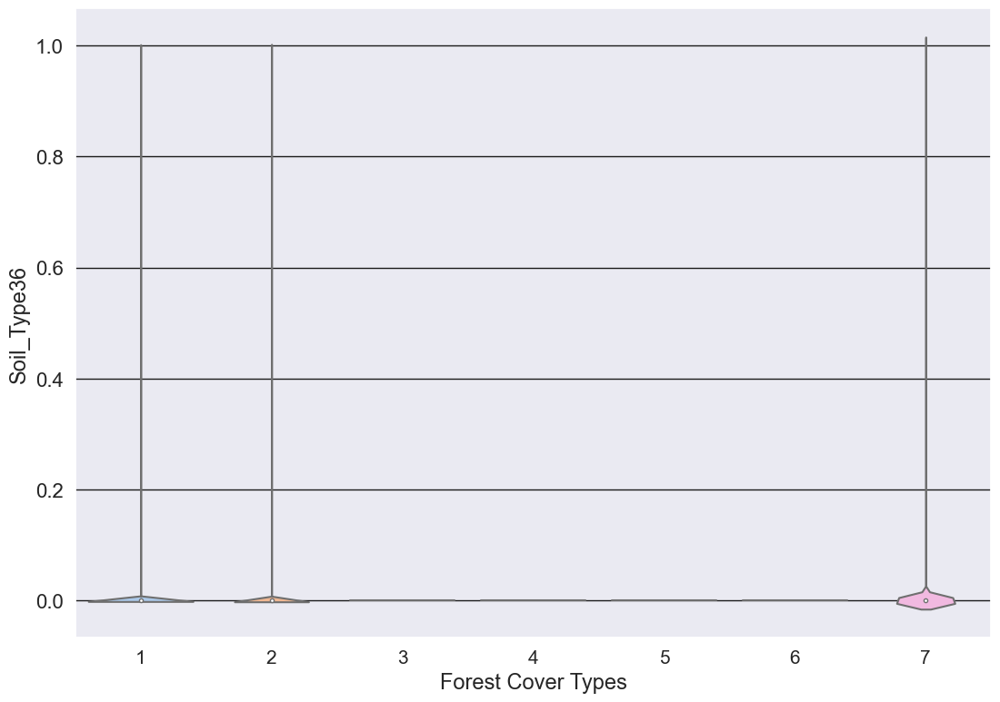

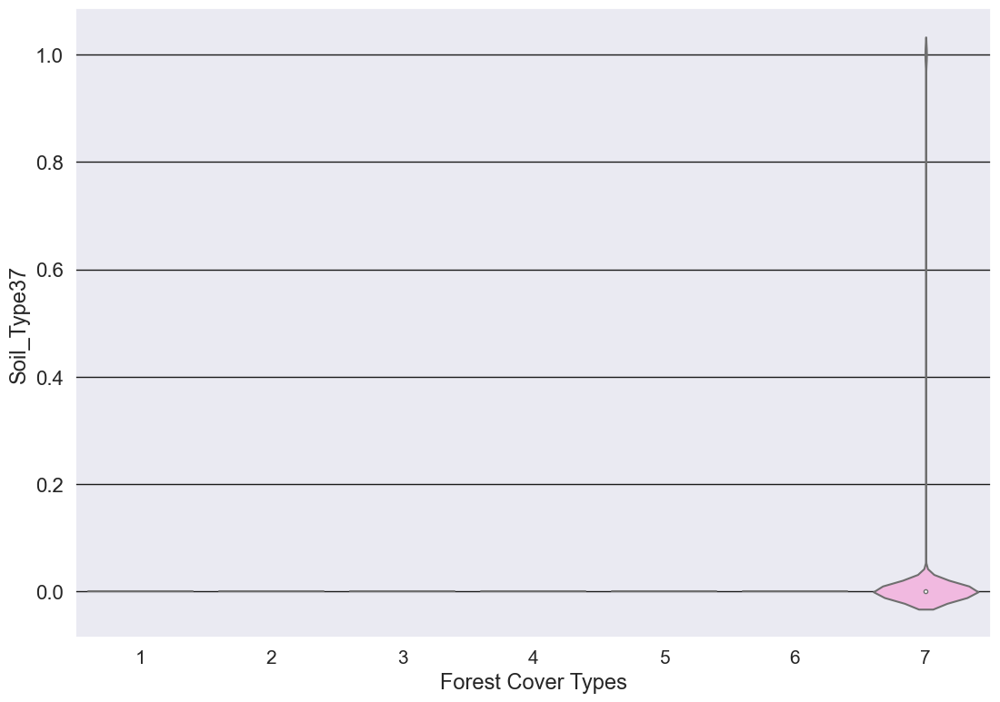

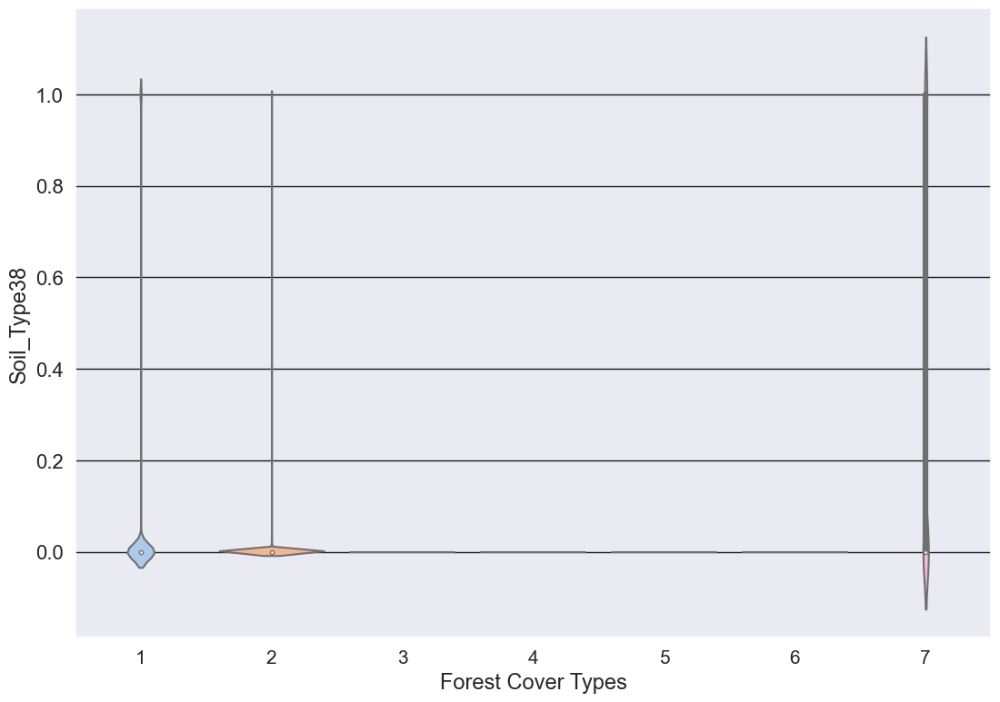

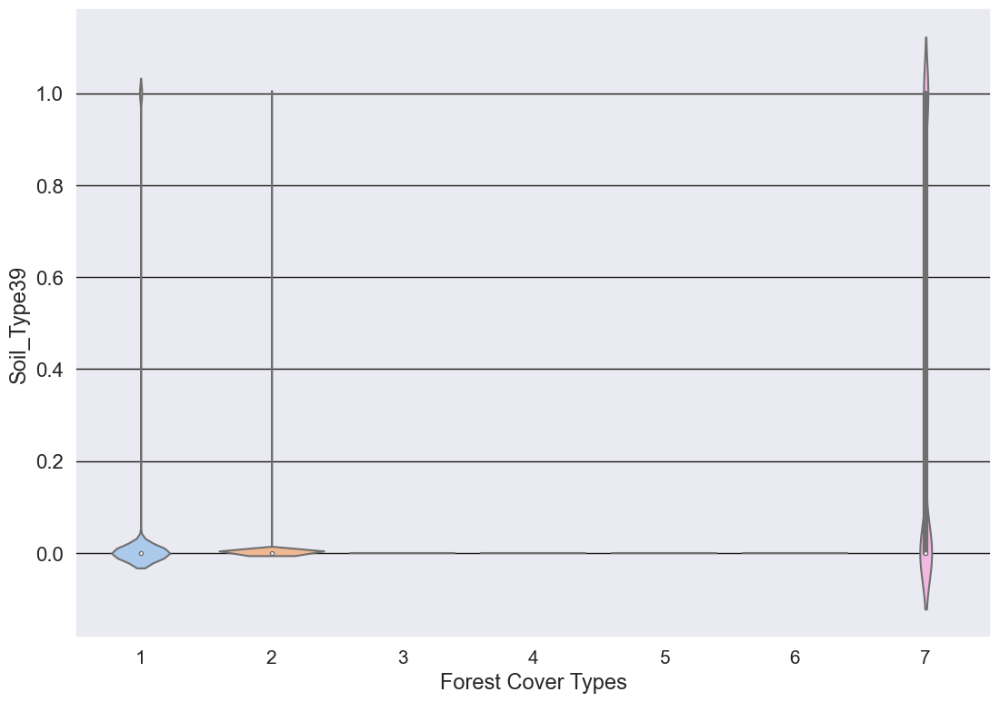

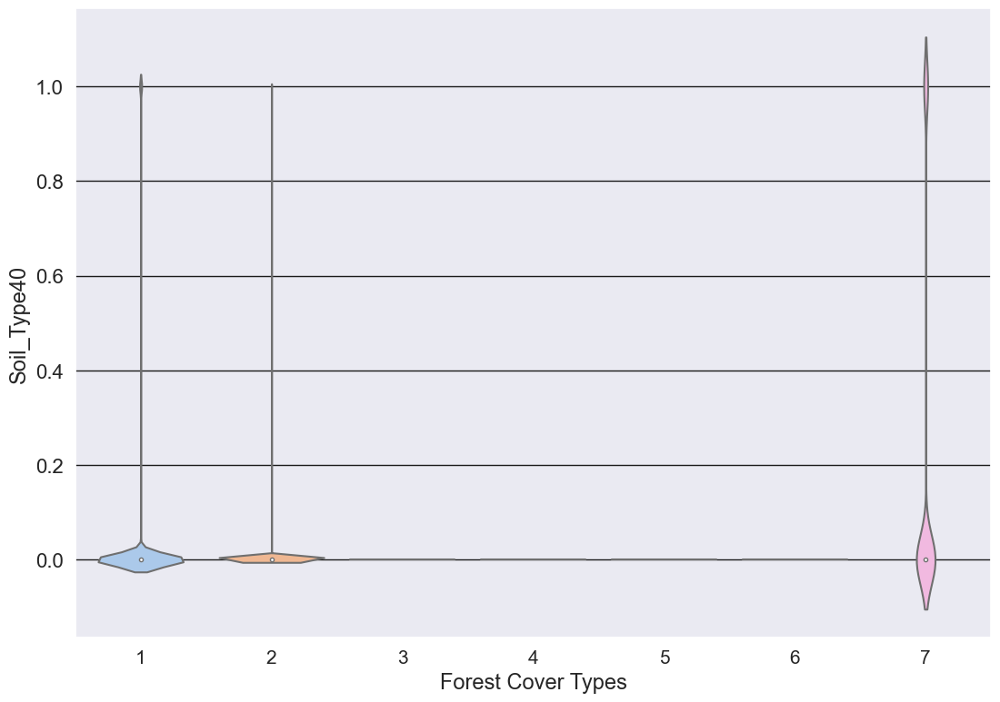

In [10]:
# 4.3 Violin Plot - Comparing Soil features with target variable
sns.set_style("darkgrid", {'grid.color': '.1'})
target = data['Cover_Type']
features = Soil_data.columns

for i in range(len(features)):
    plt.subplots(figsize=(13, 9))
    sns.violinplot(data=Soil_data, x=target, y=features[i])
    plt.xticks(size=15)
    plt.yticks(size=16)
    plt.xlabel('Forest Cover Types', size=17)
    plt.ylabel(features[i], size=17)
    plt.show()

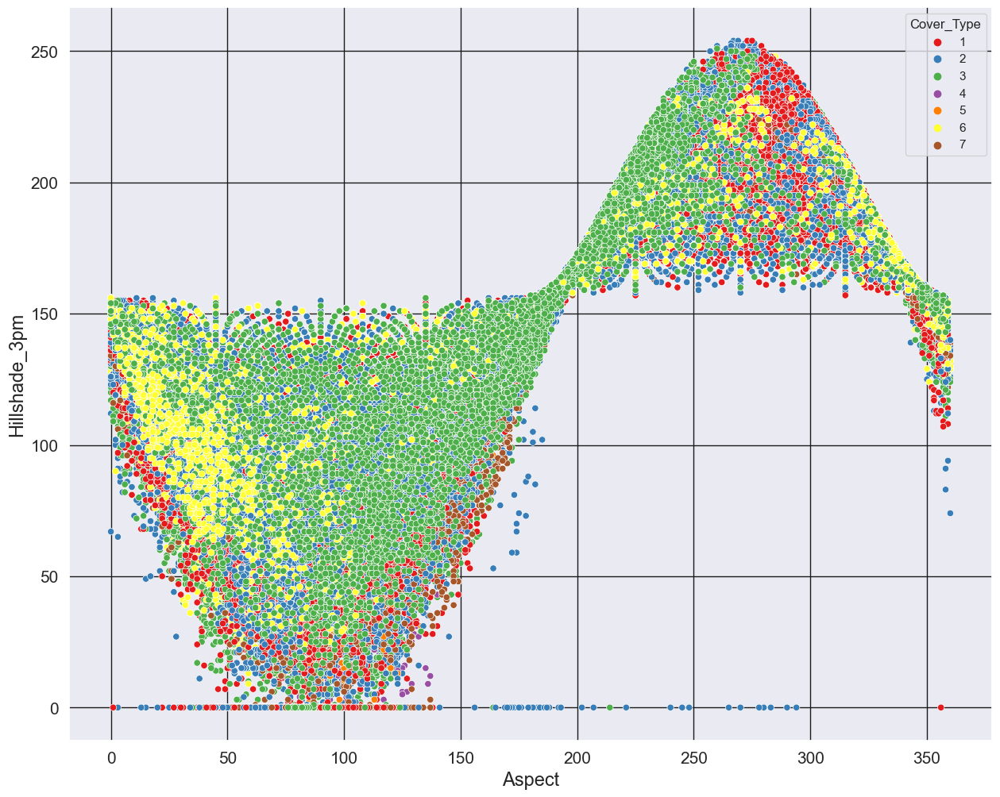

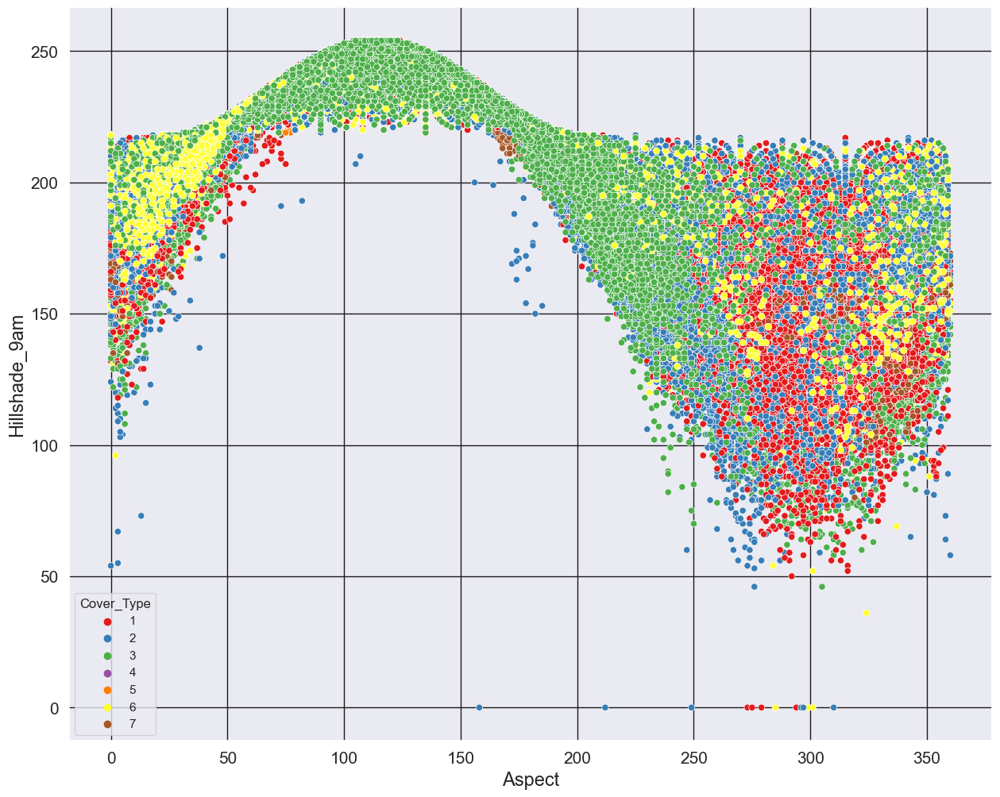

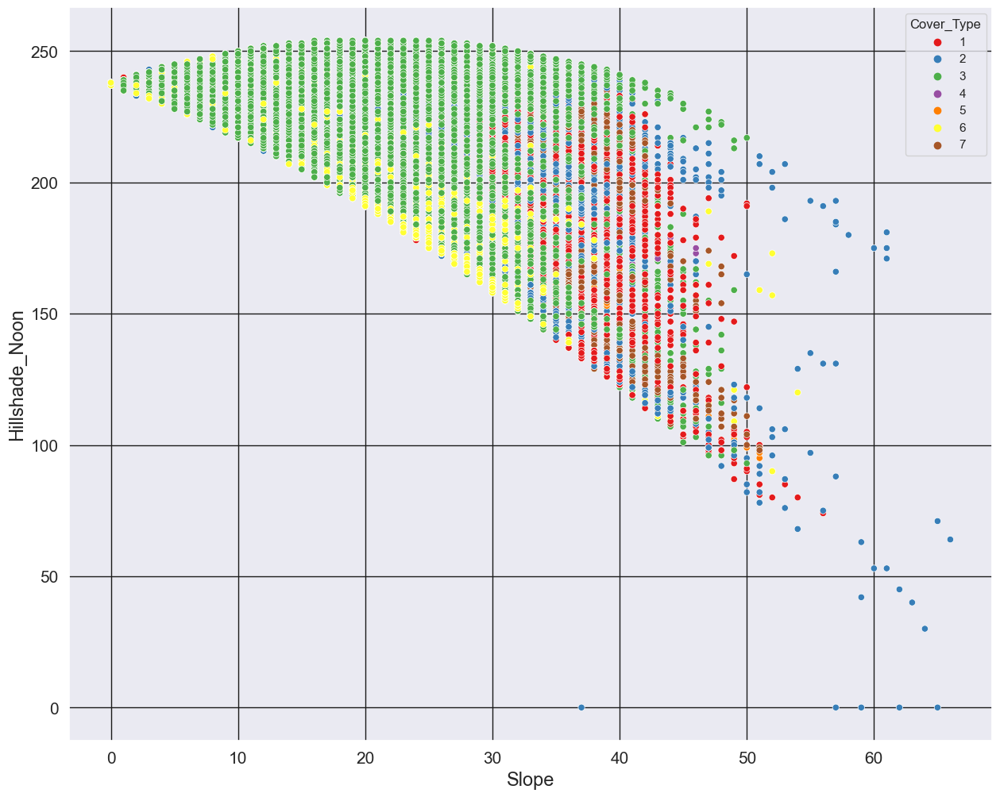

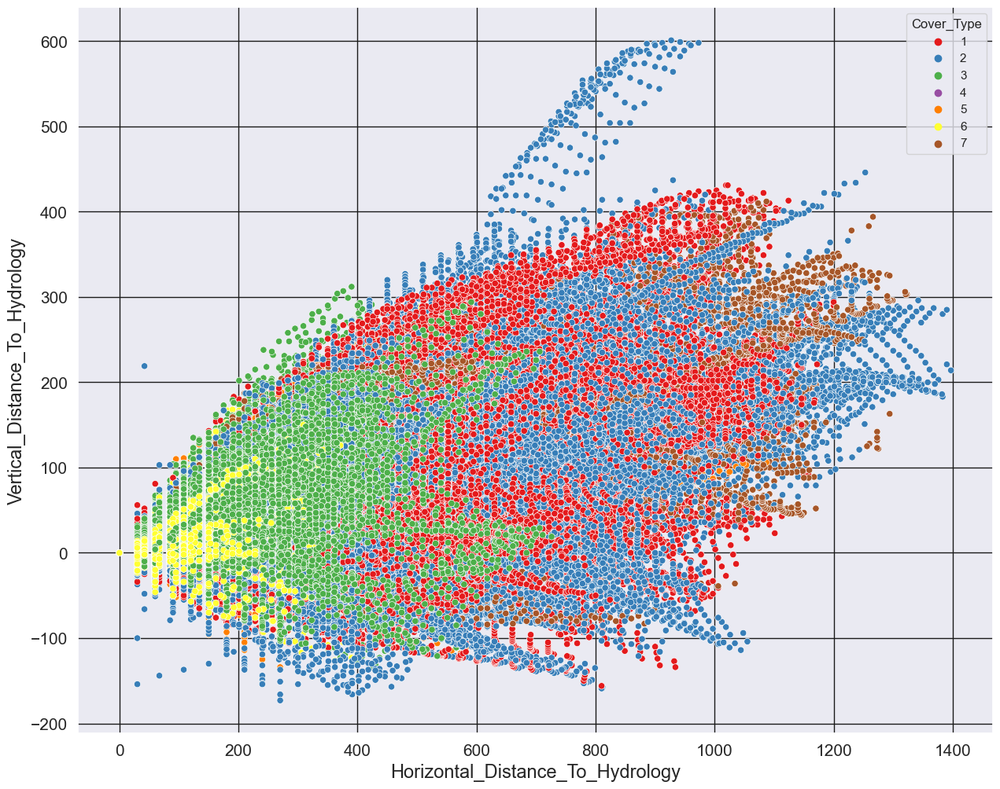

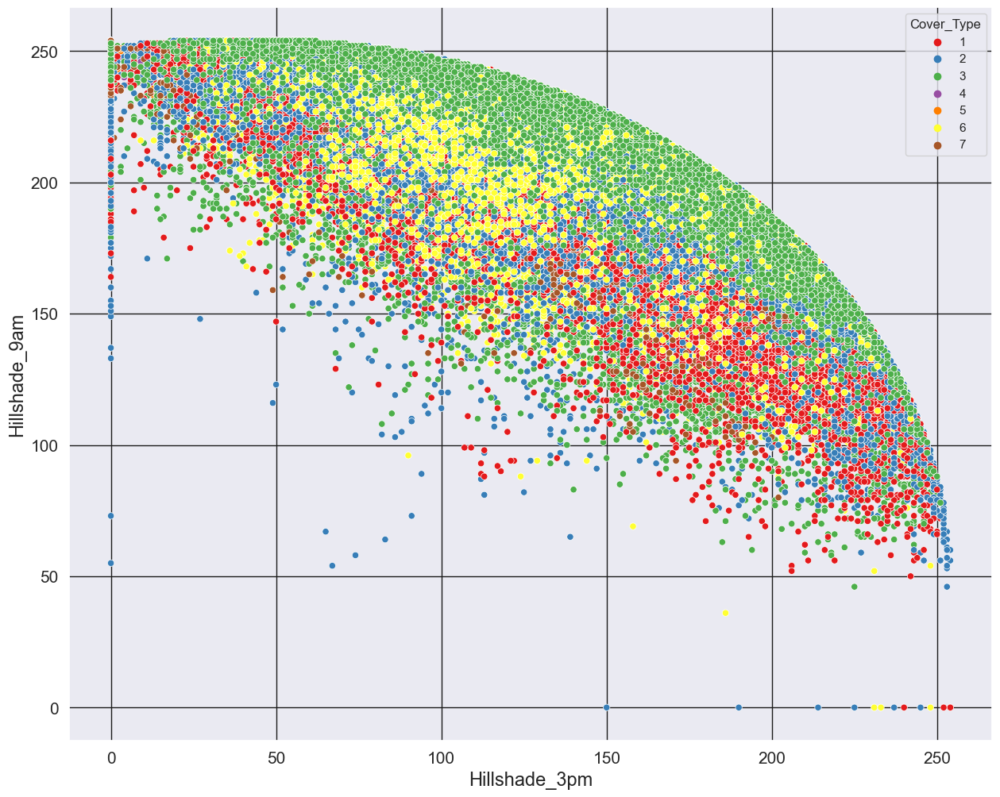

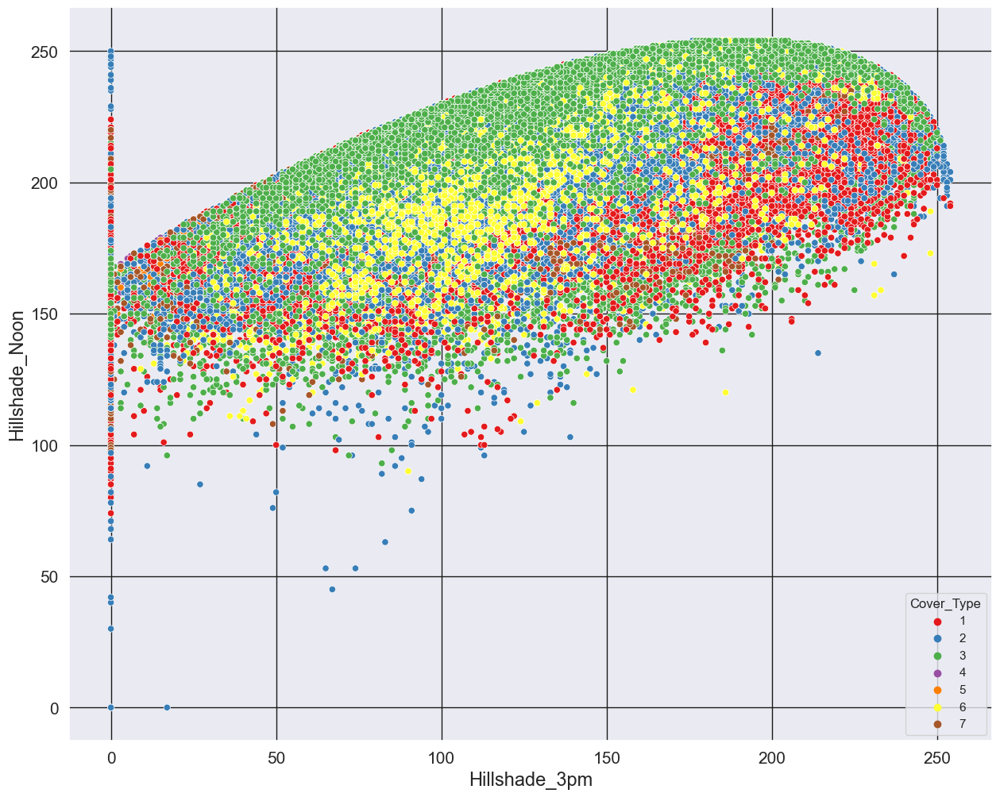

In [15]:
# 6. Scatter Plots - Correlation greater than 0.5
sns.set_style("darkgrid", {'grid.color': '.1'})

# List of pairs of features with high correlation
list_data_cor = [['Aspect', 'Hillshade_3pm'], ['Aspect', 'Hillshade_9am'], ['Slope', 'Hillshade_Noon'],
                 ['Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology'],
                 ['Hillshade_3pm', 'Hillshade_9am'], ['Hillshade_3pm', 'Hillshade_Noon']]

# Loop through pairs of features
for pair in list_data_cor:
    feature1, feature2 = pair
    
    # Create a scatter plot of the two features, color-coded by cover type
    plt.subplots(figsize=(15, 12))
    sns.scatterplot(data=data, x=feature1, y=feature2, hue="Cover_Type", legend='full', palette='Set1')
    
    plt.xticks(size=15)
    plt.yticks(size=15)
    plt.xlabel(feature1, size=17)
    plt.ylabel(feature2, size=17)
  
    plt.show()


In [16]:
# Checking if any observation have more than 1 presence of Wilderness area at same time or None

more_count = 0  # Count for more than 1 presence
none_count = 0  # Count for none presence
total = 0  # Total count

# Loop through each row of the wilderness area column
for index, row in Wild_data.iterrows():
    # Sum the values of each column in the row
    total = row.sum(axis=0)
    
    # Check if total is greater than 1
    if total > 1:
        more_count += 1  # If found, increment more_count by 1
        total = 0  # Reset the total
        break  # Do not execute code below, start from the top
        
    # Check if total is 0
    if total == 0:
        none_count += 1  # If found, increment none_count by 1
        total = 0  # Reset the total

# Print the results
print('We have', more_count, 'observations that show presence in more than 1 Wilderness Area.')
print('We have', none_count, 'observations that show no presence in any Wilderness Area.')


We have 0 observations that show presence in more than 1 Wilderness Area.
We have 0 observations that show no presence in any Wilderness Area.


In [17]:
# Checking if any observation has more than 1 presence of Soil Type area at the same time or None

more_count = 0  # Count for more than 1 presence
none_count = 0  # Count for none presence
total = 0  # Total count

# Loop through each row of the Soil Type area column
for index, row in Soil_data.iterrows():
    # Sum the values of each column in the row
    total = row.sum(axis=0)
    
    # Check if total is greater than 1
    if total > 1:
        more_count += 1  # If found, increment more_count by 1
        total = 0  # Reset the total
        break  # Do not execute code below, start from the top
        
    # Check if total is 0
    if total == 0:
        none_count += 1  # If found, increment none_count by 1
        total = 0  # Reset the total

# Print the results
print('We have', more_count, 'observations that show presence in more than 1 Soil Type Area.')
print('We have', none_count, 'observations that show no presence in any Soil Type Area.')


We have 0 observations that show presence in more than 1 Soil Type Area.
We have 0 observations that show no presence in any Soil Type Area.


In [18]:
# Deleting observations with missing values
data.dropna(inplace=True)
# Shape of the data after deleting missing entries
print("Shape of the data after deleting missing entries:", data.shape)
# Deleting duplicates, except the first observation
data.drop_duplicates(keep='first', inplace=True)
# Shape of the data after deleting duplicate entries
print("Shape of the data after deleting duplicate entries:", data.shape)

Shape of the data after deleting missing entries: (581012, 55)
Shape of the data after deleting duplicate entries: (581012, 55)


In [19]:
from sklearn.ensemble import ExtraTreesClassifier
import pandas as pd
model = ExtraTreesClassifier(random_state=53)
X = data.iloc[:, :-1]
y = data['Cover_Type']
model.fit(X, y)
feature_importances = pd.DataFrame(model.feature_importances_, index=X.columns, columns=['ETC']).sort_values('ETC', ascending=False)
model = None
top_10_features = feature_importances.head(10)
print(top_10_features)


                                         ETC
Elevation                           0.199053
Horizontal_Distance_To_Roadways     0.111130
Horizontal_Distance_To_Fire_Points  0.105355
Horizontal_Distance_To_Hydrology    0.064134
Vertical_Distance_To_Hydrology      0.058797
Aspect                              0.052114
Hillshade_Noon                      0.045301
Hillshade_9am                       0.043331
Hillshade_3pm                       0.042991
Slope                               0.037128


In [20]:
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
model = RandomForestClassifier(random_state=53)
X = data.iloc[:, :-1]
y = data['Cover_Type']
model.fit(X, y)
feature_importances = pd.DataFrame(model.feature_importances_, index=X.columns, columns=['RFC']).sort_values('RFC', ascending=False)
model = None
top_10_features = feature_importances.head(10)
print(top_10_features)


                                         RFC
Elevation                           0.240530
Horizontal_Distance_To_Roadways     0.120119
Horizontal_Distance_To_Fire_Points  0.113012
Horizontal_Distance_To_Hydrology    0.060285
Vertical_Distance_To_Hydrology      0.057994
Aspect                              0.047530
Hillshade_Noon                      0.041906
Hillshade_3pm                       0.040114
Hillshade_9am                       0.039479
Wilderness_Area4                    0.037869


In [21]:
from sklearn.ensemble import AdaBoostClassifier
import pandas as pd
model = AdaBoostClassifier(random_state=53)
X = data.iloc[:, :-1]
y = data['Cover_Type']
model.fit(X, y)
feature_importances = pd.DataFrame(model.feature_importances_, index=X.columns, columns=['ADB']).sort_values('ADB', ascending=False)
model = None
top_10_features = feature_importances.head(10)
print(top_10_features)


                                   ADB
Wilderness_Area4                  0.44
Elevation                         0.24
Horizontal_Distance_To_Hydrology  0.14
Soil_Type4                        0.06
Slope                             0.04
Vertical_Distance_To_Hydrology    0.04
Aspect                            0.02
Soil_Type10                       0.02
Soil_Type25                       0.00
Soil_Type27                       0.00


In [22]:
from sklearn.ensemble import GradientBoostingClassifier
import pandas as pd
model = GradientBoostingClassifier(random_state=53)
X = data.iloc[:, :-1]
y = data['Cover_Type']
model.fit(X, y)
feature_importances = pd.DataFrame(model.feature_importances_, index=X.columns, columns=['GBC']).sort_values('GBC', ascending=False)
model = None
top_10_features = feature_importances.head(10)
print(top_10_features)


                                         GBC
Elevation                           0.644755
Horizontal_Distance_To_Roadways     0.055174
Horizontal_Distance_To_Fire_Points  0.042103
Horizontal_Distance_To_Hydrology    0.038732
Wilderness_Area1                    0.026833
Hillshade_Noon                      0.025819
Soil_Type4                          0.016962
Soil_Type22                         0.016684
Wilderness_Area3                    0.013669
Soil_Type2                          0.012659


In [24]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Define the features and target variable
X = sample.iloc[:, :-1]
y = sample['Cover_Type']

# Perform feature scaling
scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X)

# Split the data into 80% training and 20% test+validation
X_train, X_test_valid, y_train, y_test_valid = train_test_split(X_scaled, y, test_size=0.2, random_state=53)

# Further split the test+validation data into equal halves for validation and testing
X_valid, X_test, y_valid, y_test = train_test_split(X_test_valid, y_test_valid, test_size=0.5, random_state=53)

# Print the number of training, validation, and testing observations
print("Training data shape:", X_train.shape, y_train.shape)
print("Validation data shape:", X_valid.shape, y_valid.shape)
print("Testing data shape:", X_test.shape, y_test.shape)


Training data shape: (464809, 20) (464809,)
Validation data shape: (58101, 20) (58101,)
Testing data shape: (58102, 20) (58102,)


In [27]:
from sklearn.model_selection import cross_val_score
import time
import numpy as np

def model_evaluation(clf, X_train, y_train):
    clf = clf
    t_start = time.time()
    clf = clf.fit(X_train, y_train)
    t_end = time.time()

    c_start = time.time()
    accuracy = cross_val_score(clf, X_train, y_train, cv=10, scoring='accuracy')
    f1_score = cross_val_score(clf, X_train, y_train, cv=10, scoring='f1_macro')
    c_end = time.time()

    acc_mean = np.round(accuracy.mean() * 100, 2)
    f1_mean = np.round(f1_score.mean() * 100, 2)

    t_time = np.round((t_end - t_start) / 60, 3)
    c_time = np.round((c_end - c_start) / 60, 3)

    clf = None

    print("The accuracy score of this classifier on our training set is", acc_mean,"% and f1 score is", f1_mean,"% taking", t_time,"minutes to train and", c_time,
          "minutes to evaluate cross validation and metric scores.")


In [38]:
from sklearn.naive_bayes import MultinomialNB

model_evaluation(MultinomialNB(), X_test_valid, y_test_valid)

The accuracy score of this classifier on our training set is 55.97 % and f1 score is 22.89 % taking 0.002 minutes to train and 0.013 minutes to evaluate cross validation and metric scores.


In [39]:
from sklearn.neighbors import KNeighborsClassifier

model_evaluation(KNeighborsClassifier(n_jobs=-1), X_test_valid, y_test_valid)

KeyboardInterrupt: 

In [41]:
from sklearn.ensemble import RandomForestClassifier
model_evaluation(RandomForestClassifier(n_jobs=-1, random_state=53), X_test_valid, y_test_valid)

The accuracy score of this classifier on our training set is 90.31 % and f1 score is 84.06 % taking 0.22 minutes to train and 5.516 minutes to evaluate cross validation and metric scores.


In [ ]:
from sklearn.linear_model import SGDClassifier
model_evaluation(SGDClassifier(n_jobs=-1, random_state=53), X_test_valid, y_test_valid)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_evaluation(AdaBoostClassifier(random_state=53), X_test_valid, y_test_valid)

In [ ]:
from sklearn.linear_model import LogisticRegressio
model_evaluation(LogisticRegression(n_jobs=-1, random_state=53), X_test_valid, y_test_valid)

In [36]:
# Importing train-test function
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score


# Split the data into train, validation, and test sets (80:10:10 split)
X_train, X_val_test, y_train, y_val_test = train_test_split(X_scaled, y, test_size=0.2, random_state=53)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.5, random_state=53)

# Print the number of observations in each set
print("Number of observations - Train set:", X_train.shape[0])
print("Number of observations - Validation set:", X_val.shape[0])
print("Number of observations - Test set:", X_test.shape[0])

# Defining the best chosen classifier
clf = RandomForestClassifier(n_estimators=50, random_state=53)

# Training the model
clf.fit(X_train, y_train)

# Predicting unseen data on validation set
val_predict = clf.predict(X_val)

# Calculating accuracy on validation set
val_accuracy = accuracy_score(y_val, val_predict)

# Calculating F1 score on validation set
val_f1_score = f1_score(y_val, val_predict, average='macro')

# Predicting unseen data on test set
test_predict = clf.predict(X_test)

# Calculating accuracy on test set
test_accuracy = accuracy_score(y_test, test_predict)

# Calculating F1 score on test set
test_f1_score = f1_score(y_test, test_predict, average='macro')

# Rounding the scores to 3 decimal places
val_accuracy = np.round(val_accuracy * 100, 3)
val_f1_score = np.round(val_f1_score * 100, 3)
test_accuracy = np.round(test_accuracy * 100, 3)
test_f1_score = np.round(test_f1_score * 100, 3)

# Printing the results
print("The accuracy score of our final model Random Forest Classifier on the validation set is", val_accuracy, "% and F1 score is", val_f1_score, "%.")
print("The accuracy score of our final model Random Forest Classifier on the test set is", test_accuracy, "% and F1 score is", test_f1_score, "%.")


Number of observations - Train set: 464809
Number of observations - Validation set: 58101
Number of observations - Test set: 58102
The accuracy score of our final model Random Forest Classifier on the validation set is 95.234 % and F1 score is 92.193 %.
The accuracy score of our final model Random Forest Classifier on the test set is 95.095 % and F1 score is 91.716 %.


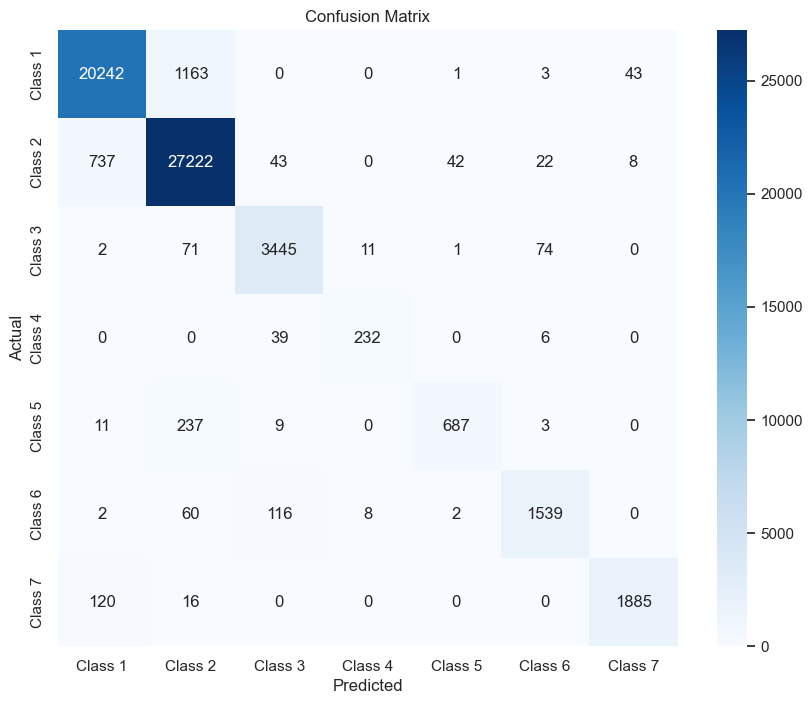

In [40]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Predict on test data
y_pred = clf.predict(X_test)

# Create confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a figure and axes
plt.figure(figsize=(10, 8))
ax = plt.axes()

# Plot confusion matrix heatmap
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", ax=ax)

# Set labels, title, and ticks
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6', 'Class 7'])
ax.yaxis.set_ticklabels(['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6', 'Class 7'])

# Display the plot
plt.show()
